In [8]:
import data.breathe_data as bd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import data.helpers as dh
from datetime import timedelta
import o2_fev1_analysis.smooth as smooth
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [27]:
df = bd.load_meas_from_excel("BR_O2_FEV1_FEF2575_PEF_Nan_conservative_smoothing")

In [10]:
df.describe()

,FEV1,O2 Saturation,FEF2575,PEF,PEF (L/s),ecFEV1,ecFEF2575,ecPEF (L/s),Height,Age,Predicted FEV1,Healthy O2 Saturation,ecFEV1 % Predicted,FEV1 % Predicted,O2 Saturation % Healthy
count,51584.000000,54687.000000,46582.000000,25308.000000,25308.000000,51584.000000,46582.000000,25308.000000,60785.000000,60785.000000,60785.000000,60785.000000,51584.000000,51584.000000,54687.000000
mean,2.263909,96.908918,1.853057,407.891299,6.798188,2.275285,1.904584,6.887204,167.008765,36.703891,3.512469,97.681112,64.448130,64.107891,99.216866
std,0.875829,1.921289,1.181387,142.993056,2.383218,0.871223,1.182393,2.355711,9.365322,10.983636,0.669015,0.537670,20.340190,20.475552,2.016304
min,0.300000,71.000000,0.280000,18.000000,0.300000,0.400000,0.330000,1.066667,140.000000,18.000000,2.157715,96.755491,14.155090,10.616317,72.390861
25%,1.640000,96.000000,0.970000,300.000000,5.000000,1.650000,1.030000,5.433333,160.000000,28.000000,2.979444,97.132167,48.475633,47.990187,98.593661
50%,2.120000,97.000000,1.480000,397.000000,6.616667,2.140000,1.550000,6.700000,166.500000,36.000000,3.392774,97.971056,62.781060,62.439214,99.782916
75%,2.800000,98.000000,2.530000,502.000000,8.366667,2.810000,2.590000,8.416667,174.000000,43.000000,4.095194,98.186300,77.758999,77.512800,100.755106
max,5.990000,100.000000,8.680000,966.000000,16.100000,5.990000,8.680000,16.100000,195.000000,67.000000,5.322753,98.562976,149.505350,149.505350,103.181154


In [11]:
df_for_ID = df[df.ID == "101"]


def count_records_per_day(df_for_ID):
    cols = ["FEV1", "O2 Saturation", "FEF2575", "PEF"]

    start_date = df_for_ID["Date Recorded"].min()

    # Create Day column and put current date - start_date into it
    df_for_ID["Day"] = (df_for_ID["Date Recorded"] - start_date).apply(lambda x: x.days)

    # Count number of measurements per day
    df_count = df_for_ID.groupby("Day")[cols].count()

    # Sum count on axis 0
    return df_count.sum(axis=1).reset_index().rename(columns={0: "n_measurements"})

In [12]:
df_data = (
    df.groupby("ID")
    .apply(count_records_per_day)
    .reset_index()
    .drop(columns=["level_1"])
)

In [13]:
df_data

,ID,Day,n_measurements
0,101,0,3
1,101,1,3
2,101,2,3
3,101,3,3
4,101,4,3
...,...,...,...
60780,553,172,4
60781,553,198,4
60782,553,199,1
60783,553,200,4


In [14]:
# Calculate total measurements per ID
id_totals = df_data.groupby("ID")["n_measurements"].sum().sort_values(ascending=False)

df_heatmap = df_data.pivot(index="ID", columns="Day", values="n_measurements")
df_heatmap = df_heatmap.reindex(
    id_totals.index
)  # Reorder rows based on total measurements

# Replace NaN with 0
df_heatmap = df_heatmap.fillna(0)

fig = px.imshow(
    df_heatmap,
    color_continuous_scale=["black", "red", "orange", "yellow", "lightgreen"],
)
fig.update_traces(colorbar=dict(title="Number of Measurements"))
fig.update_yaxes(
    showticklabels=False, title=f"Participants (n = {df_data.ID.nunique()})"
)
fig.update_layout(width=600, height=500)

fig.show()

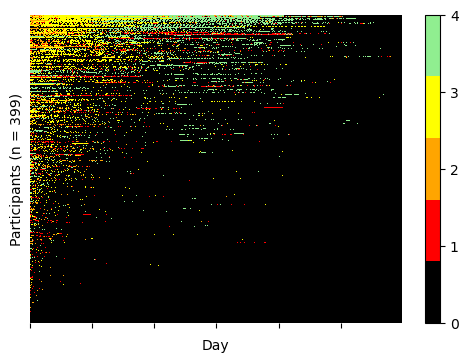

In [21]:
# Calculate total measurements per ID
id_totals = df_data.groupby("ID")["n_measurements"].sum().sort_values(ascending=False)

df_heatmap = df_data.pivot(index="ID", columns="Day", values="n_measurements")
df_heatmap = df_heatmap.reindex(
    id_totals.index
)  # Reorder rows based on total measurements

# Replace NaN with 0
df_heatmap = df_heatmap.fillna(0)

# Create figure with seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(
    df_heatmap,
    cmap=sns.color_palette(["black", "red", "orange", "yellow", "lightgreen"]),
    cbar=False,  # Hide the initial colorbar
)
# Hide y-axis labels
plt.yticks([])
plt.ylabel(f"Participants (n = {df_data.ID.nunique()})")
plt.xlabel("Day")
# days in years on x axis
plt.xticks(list(range(0, 1800, 300)))
# Reduce height and width
plt.gcf().set_size_inches(6, 4)
# Get the heatmap mappable and create colorbar with custom ticks
cbar = plt.colorbar(plt.gca().collections[0], ticks=[0, 1, 2, 3, 4, 5])

plt.show()

# Data demographics

In [52]:
df = bd.load_meas_from_excel("BR_O2_FEV1_FEF2575_conservative_smoothing_with_idx")

In [70]:
ppfev1 = df.groupby("ID").apply(lambda df: df["ecFEV1 % Predicted"].mean())
n_id_sup_90 = len(ppfev1[ppfev1 >= 90])
prct_id_sup_90 = n_id_sup_90 / len(ppfev1) * 100
n_id_70_90 = len(ppfev1[(ppfev1 >= 70) & (ppfev1 < 90)])
prct_id_70_90 = n_id_70_90 / len(ppfev1) * 100
n_id_40_70 = len(ppfev1[(ppfev1 >= 40) & (ppfev1 < 70)])
prct_id_40_70 = n_id_40_70 / len(ppfev1) * 100
n_id_inf_40 = len(ppfev1[ppfev1 < 40])
prct_id_inf_40 = n_id_inf_40 / len(ppfev1) * 100

# Print
print(f">=90%: {n_id_sup_90} ({prct_id_sup_90:.0f}%)")
print(f"70-89%: {n_id_70_90} ({prct_id_70_90:.0f}%)")
print(f"40-69%: {n_id_40_70} ({prct_id_40_70:.0f}%)")
print(f"<40%: {n_id_inf_40} ({prct_id_inf_40:.0f}%)")

>=90%: 55 (16%)
70-89%: 107 (30%)
40-69%: 151 (43%)
<40%: 39 (11%)


In [132]:
ids = df.ID.unique()

In [133]:
df_pat = pd.read_csv(
    f"{dh.get_path_to_main()}DataFiles/BR/REDCapData/ProcessedData/brPatient_20240703.csv",
    # usecols="A, E, G, H, Y"
    # usecols=[0, 6, 7, 24],
    dtype={"ID": str},
)
df_pat = df_pat.set_index("ID").loc[ids].reset_index()
print(df_pat.columns)
df_pat.head(1)

Index(['ID', 'REDCapID', 'PatClinDate', 'StudyDate', 'DOB', 'Age', 'Sex',
       'Height', 'Weight', 'PredictedFEV1', 'CFGene1', 'CFGene2',
       'GeneralComments', 'ConsentStatus', 'ConsentDate', 'WithdrawalDate',
       'WithdrawalComments', 'PartitionKey', 'Hospital', 'StudyNumber',
       'Prior6Mnth', 'Post6Mnth', 'StudyEmail', 'CalcAgeExact', 'CalcAge'],
      dtype='object')


,ID,REDCapID,PatClinDate,StudyDate,DOB,Age,Sex,Height,Weight,PredictedFEV1,...,WithdrawalDate,WithdrawalComments,PartitionKey,Hospital,StudyNumber,Prior6Mnth,Post6Mnth,StudyEmail,CalcAgeExact,CalcAge
0,101,101,2023-10-09,2019-02-20,1965-11-08,53.0,Male,173.0,66.0,3.59,...,NaN,NaN,bf306cf3-e0e3-4293-ae15-c4e8c2f85e34,PAP,projectb861@gmail.com,2018-08-20,2019-08-20,projectb861@gmail.com,53.282854,53


In [134]:
df_pat["BMI"] = df_pat["Weight"] / (df_pat["Height"] / 100) ** 2
print(f"Mean BMI: {df_pat['BMI'].mean():.1f} ± {df_pat['BMI'].std():.1f}")
print(f"Mean Age: {df_pat['CalcAge'].mean():.1f} ± {df_pat['CalcAge'].std():.1f}")
n_female = (df_pat["Sex"] == "Female").sum()
print(f"Female: {n_female} ({n_female/len(df_pat)*100:.1f}%)")

Mean BMI: 23.9 ± 3.6
Mean Age: 32.6 ± 11.1
Female: 183 (52.0%)


In [135]:
df_pat.ID.nunique()

352

In [72]:
df_pat.columns

Index(['ID', 'REDCapID', 'PatClinDate', 'StudyDate', 'DOB', 'Age', 'Sex',
       'Height', 'Weight', 'PredictedFEV1', 'CFGene1', 'CFGene2',
       'GeneralComments', 'ConsentStatus', 'ConsentDate', 'WithdrawalDate',
       'WithdrawalComments', 'PartitionKey', 'Hospital', 'StudyNumber',
       'Prior6Mnth', 'Post6Mnth', 'StudyEmail', 'CalcAgeExact', 'Age', 'BMI'],
      dtype='object')

In [137]:
# Count number of times where CFGene1 and CFGene2 are both equal and equalt to 1
# DRop na in CFGene1 or CFGene2
df_gene = df_pat.dropna(subset=["CFGene1", "CFGene2"])

n_homo_d508 = ((df_gene["CFGene1"] == 1) & (df_gene["CFGene2"] == 1)).sum()
n_hetero_d508 = ((df_gene["CFGene1"] == 1) & (df_gene["CFGene2"] != 1)).sum()
n_other = ((df_gene["CFGene1"] != 1) & (df_gene["CFGene2"] != 1)).sum() + 2

print(f"Homo D508: {n_homo_d508} ({np.round(n_homo_d508 / len(df_gene) * 100, 1)}%)")
print(
    f"Hetero D508: {n_hetero_d508} ({np.round(n_hetero_d508 / len(df_gene) * 100, 1)}%)"
)
print(f"other: {n_other} ({np.round(n_other / len(df_gene) * 100, 1)}%)")

print(len(df_gene))

Homo D508: 162 (46.3%)
Hetero D508: 157 (44.9%)
other: 32 (9.1%)
350


In [138]:
df_drug = bd.add_drug_therapy_to_df(df)

ERROR:root:ID 175 - ?? Symkevi start date is wrong, removing it because no clue about the true date (maybe 2019?)
ERROR:root:ID 206 - Updating Ivacaftor stop date to not overlap and changing Ivacaftor + Symkevi to Trikafta


In [139]:
# Count number of patients prescribed each CFTR modulator
cftr_modulators = df_drug.DrugTherapyType.unique()


def has_drug_therapy(df, cftr_mod):
    drug_therapies = df.DrugTherapyType.unique()
    # Return True if cftr_mod is in drug_therapies
    return cftr_mod in drug_therapi


for cftr_mod in cftr_modulators:
    mask = df.groupby("ID").apply(lambda df: cftr_mod in df.DrugTherapyType.unique())
    n_mod = mask.sum()
    prct_mod = n_mod / df.ID.nunique() * 100
    print(f"{cftr_mod}: {n_mod} ({prct_mod:.0f}%)")

None: 127 (36%)
Symkevi: 88 (25%)
Trikafta: 286 (81%)
Ivacaftor: 23 (7%)
Orkambi: 4 (1%)
Unknown: 2 (1%)


In [117]:
a = "a"
bc = ["b", "c"]
a in bc

False

### Data value counts

In [ ]:
df_all = pd.read_csv(
    dh.get_path_to_main()
    + "DataFiles/BR/MeasurementData/ProcessedData/BRPhysdata-20250803T161650.csv",
    delimiter=",",
)

In [5]:
df_all.RecordingType.value_counts()

RecordingType
CalorieRecording         151186
RestingHRRecording       114766
MinsAsleepRecording       99197
MinsAwakeRecording        95072
O2SaturationRecording     54687
HasColdOrFluRecording     52823
HasHayFeverRecording      52823
WellnessRecording         52823
CoughRecording            52704
FEV1Recording             51595
FEV6Recording             50759
PulseRateRecording        49825
FEF2575Recording          46582
FEV075Recording           46378
FEV1DivFEV6Recording      46371
WeightRecording           40634
PEFRecording              25308
Name: count, dtype: int64

# Demographics SmartCareCF

In [28]:
import data.smartcare_data as scd

df_sc = scd.load_o2_fev1_df_from_excel()

df_sc.describe()

,O2 Saturation,FEV1,Study Date,DOB,Age,Height,Weight,Predicted FEV1,ecFEV1,ecFEV1 % Predicted,FEV1 % Predicted
count,9574.000000,9574.000000,9574,9574,9574.000000,9574.000000,9574.000000,9574.000000,9574.000000,9574.000000,9574.000000
mean,95.640694,1.753641,2016-03-25 10:17:16.306663936,1980-12-11 06:34:22.084812992,35.268122,166.275546,63.733366,3.483150,1.841459,53.112109,50.586295
min,76.000000,0.380000,2015-01-21 00:00:00,1950-06-21 00:00:00,18.000000,143.000000,34.300000,2.351271,0.450000,14.853276,10.168222
25%,94.000000,1.230000,2015-12-23 00:00:00,1975-04-03 00:00:00,27.000000,160.000000,54.500000,3.064794,1.300000,38.237526,36.025779
50%,96.000000,1.660000,2016-02-29 00:00:00,1981-03-11 00:00:00,35.000000,165.000000,63.400000,3.430528,1.760000,51.141526,48.187143
75%,97.000000,2.090000,2016-07-22 00:00:00,1989-04-20 00:00:00,41.000000,174.000000,69.900000,3.958416,2.180000,66.419546,63.357078
max,100.000000,5.040000,2016-11-04 00:00:00,1998-07-30 00:00:00,66.000000,189.000000,117.300000,5.015503,5.040000,112.320356,112.320356
std,2.244531,0.720614,NaN,NaN,9.997005,9.739570,11.888466,0.598925,0.735093,19.271228,18.984712


In [48]:
maxfev1p = df_sc.groupby("ID")["FEV1 % Predicted"].mean().values


print((maxfev1p < 40).sum())
print((maxfev1p < 40).sum() / len(maxfev1p))

# >=40 < 70
print(((maxfev1p >= 40) & (maxfev1p < 70)).sum())
print(((maxfev1p >= 40) & (maxfev1p < 70)).sum() / len(maxfev1p))

# >=70 < 80
print(((maxfev1p >= 70) & (maxfev1p < 90)).sum())
print(((maxfev1p >= 70) & (maxfev1p < 90)).sum() / len(maxfev1p))

# >=80 < 90
print((maxfev1p >= 90).sum())
print((maxfev1p >= 90).sum() / len(maxfev1p))

48
0.3287671232876712
75
0.5136986301369864
19
0.13013698630136986
4
0.0273972602739726


In [29]:
df.groupby("ID")["FEV1 % Predicted"].max().mean()

76.0064215523044

In [31]:
df.groupby("ID")["FEV1 % Predicted"].max().std()

22.132904197619247

In [30]:
df_sc.groupby("ID")["FEV1 % Predicted"].max().mean()

57.58582929749509

In [32]:
df_sc.groupby("ID")["FEV1 % Predicted"].max().std()

21.077422892569388